Esercitazione Pratica: "Model Swapping" (Sostituzione dell'Architettura)

Contesto 
Avete appena analizzato lo script che utilizza MobileNetV2 per classificare un'immagine. MobileNet è ottima per dispositivi mobili perché è leggera, ma a volte abbiamo bisogno di reti più "potenti" o semplicemente diverse per confrontare i risultati. 
In questo esercizio, metterete le mani "sotto il cofano" del codice appena visto. Dovrete sostituire il "cervello" (il modello neurale) con una delle architetture più famose della storia della Computer Vision: la VGG16. 
Obiettivo 
Modificare lo script Python fornito nell'esempio per: 
1. Utilizzare l'architettura VGG16 al posto di MobileNetV2. 
2. Cambiare l'immagine di input (scegliete un soggetto diverso da una fragola). 
3. Visualizzare le Top-5 predizioni invece delle Top-3. 

Istruzioni Passo-Passo 

1. Modifica delle Importazioni (Attenzione!) 
Il primo passo è cambiare le librerie che state importando. 
* Task: Trovate all'interno di tensorflow.keras.applications il modulo per VGG16. 
* Importante: Ogni rete ha il suo metodo preprocess_input . Non potete usare quello di MobileNet per la VGG16, altrimenti i colori risulteranno "sbagliati" per la rete e la predizione sarà pessima. Assicuratevi di importare preprocess_input e decode_predictions dal modulo corretto. 

2. Sostituzione del Modello
Nella funzione che carica il modello:
* Task: Istanziate la classe VGG16 invece di MobileNetV2. 
* Parametri: Mantenete weights='imagenet' e include_top=True (vogliamo classificare, non fare feature extraction). 

3. Cambio dell'Immagine Task: 
* Cambiate la variabile IMMAGINE_URL. 
* Suggerimento: Cercate su Google Images (es. Wikipedia Commons) l'URL di un oggetto ben definito: un'auto sportiva, un elefante, un pianoforte. Assicuratevi che l'URL termini con .jpg o .png . 

4. Espansione dei Risultati 
Nella funzione di classificazione: 
* Task: Modificate il parametro della funzione decode_predictions per farvi restituire le prime 5 classi più probabili, invece di 3. 

Suggerimenti Tattici (Senza Soluzione) 
* Dove trovo VGG16? 
Se MobileNet era in tensorflow.keras.applications.mobilenet_v2 , dove pensate si trovi la VGG16? Provate a intuire il percorso o consultate la documentazione di Keras. 
* Il Preprocessing è matematico 
MobileNet scala i pixel tra -1 e 1. VGG16 lavora in modo diverso (sottrae la media dei canali RGB del dataset ImageNet). Se il vostro codice gira ma vi dice che un'auto sportiva è un "nematode" o un "worm", al 99% avete dimenticato di cambiare l'import di preprocess_input. 
* Le dimensioni dell'immagine 
VGG16, come MobileNet, è stata addestrata su immagini quadrate. Per fortuna, anche VGG16 accetta 224x224. Quindi, la riga del resize non ha bisogno di modifiche drastiche, ma controllate sempre di non aver toccato la logica del resize. 
* Il download sembra bloccato? 
VGG16 è un modello molto più "pesante" di MobileNet (circa 500MB contro 14MB). La prima volta che lanciate lo script modificato, il download dei pesi potrebbe impiegare qualche minuto. 
Abbiate pazienza!

Verifica del Successo
Saprete di aver completato l'esercizio correttamente se: 
* Il download iniziale indica un le di dimensioni maggiori di 500MB ( le .h5 ). 
* Lo script non crasha. 
* Le predizioni stampate a video hanno senso per l'immagine che avete scelto (es. se avete scelto un leone, la top 1 deve essere "lion" o simile). 
* Vedete stampate 5 righe di risultati percentuali.

A) Costruzione datase: scarica un dataset immmagini da Wikimedia Commons
B) Carica 3 modelli diversi pre-addestrati (MobilNeNetV2, VGG16, ResNet50), classifica e confronta per ogni singola immmagine
C) analisi finale ed export excel

Non addestro una rete neurale da zero (servirebbero migliaia di immagini e ore di calcolo). Uso 3 reti già addestrate e le uso per fare previsioni.

---------------  A) COSTRUZIONE DATASET (dowload immagini) -------------------

A.1) Importazione e configurazione

In [100]:
import hashlib      # per creare "impronte digitali" di file
import math
import pathlib      # gestisce percorsi di file/cartelle in modo portabile
import time
from datetime import datetime
from io import BytesIO
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests      # per fare chiamate HTTP (scaricare da internet)
import tensorflow as tf
from PIL import Image #verifica che l'immagine sia in formato RGB


In [101]:
DATASET_DIR = pathlib.Path("dataset_immagini") #cartella dove finiranno tutte le immagini, organizzate per sottocartelle per categorie
WIKIMEDIA_API = "https://commons.wikimedia.org/w/api.php"
NUM_IMMAGINI_PER_CATEGORIA = 10

print("Cartella dataset:", DATASET_DIR.resolve())

Cartella dataset: C:\Users\uberti\iCloudDrive\iCloudDrive\Barbara\EPICODE\PYTHON\MODULO 4\5_RetiConvoluzionali\dataset_immagini


In [102]:
ESTENSIONI_VALIDE = { ".jpg", ".jpeg", ".png"}

A.2) Catalogo delle immagini

In [103]:
CATEGORIE_RICERCA = {
    "gatto": "domestic cat animal",
    "elefante": "elephant animal",
    "farfalla": "butterfly insect",
    "automobile": "car automobile",
    "aereo": "airplane aircraft",
    "treno": "train locomotive",
    "bicicletta": "bicycle",
    "motocicletta": "motorcycle",
    "barca": "boat vessel",
    "chitarra": "guitar musical instrument",
}

A.3) Download immagini

In [ ]:
def cerca_file_wikimedia(query, limite=30):
    """
    Cerca file su Wikimedia Commons (API REST pubblica).

    Restituisce i titoli delle pagine File:
    ad esempio:
    File:Domestic cat.jpg

    Ricevo un json ed estraggo solo ciò che mi server  (action, format, generator, gsrsearch, ecc)
    """

    #Chiamo una API REST pubblica (Wikimedia Commons)

    parametri = {
        "action": "query", #azione lettura
        "format": "json", #formato della risposta
        "generator": "search", #cerchi immmagini e con prop:imageinfo ottini i metadati delle immagini trovato
        "gsrsearch": f"{query} filetype:bitmap", #file bitmap filtra solo file raster (jps, png, fig, webp...) escudendo file vettoriali (svg) o altri formati fotografici
        "gsrnamespace": 6,      # namespace File
        "gsrlimit": limite, #risultati massimi che si vogliono
        "prop": "imageinfo", #voglio anche le proprieta del file (ottengo anche il link scaricabile)
        "iiprop": "url|mime|size", #chiedo: 1) url:indirizzo per scaricare il file; mime: tipo di contenuto (es.jpeg); size: larghezza e altezza in pixel
        "iiurlwidth": 1000, #dimensione scaricabile, scaricare l'originale a piena risoluzione sarebbe uno spreco dato che poi ridimensiono a 224x224
            }

    headers = {
        "User-Agent": ( #user-agent personalizzato lo richiede Wikimedia per policy, altrimento può bloccare le richieste
            "BarbaraImageBenchmark/1.0 "
            "(educational project; contact: barbara.uberti@tiscali.it)"
        )
    }

    response = requests.get(
        WIKIMEDIA_API, #sito
        params=parametri, #parametri
        headers=headers, #user-agent
        timeout=30
    )
    response.raise_for_status()
    dati = response.json()
    pagine = dati.get("query", {}).get("pages", {})

    risultati = []

    for pagina in pagine.values():
        imageinfo = pagina.get("imageinfo")
        if not imageinfo:
            continue
        info = imageinfo[0]
        risultati.append({
            "titolo": pagina.get("title"),
            "url": info.get("thumburl") or info.get("url"),
            "mime": info.get("mime"),
            "larghezza": info.get("width"),
            "altezza": info.get("height"),
        })

    print(risultati)
    return risultati

In [106]:
#HASH=Impronta digitale, se due file hanno lo stesso hash sono lo stesso contenuto
def calcola_hash(contenuto):
    """
    Calcola un'identità digitale del file.
    Due file con lo stesso contenuto generano lo stesso hash, serve a riconoscere duplicati e scartarli
    """
    return hashlib.sha256(contenuto).hexdigest()

A.4) Creazione dataset da Wikimedia

In [22]:
def scarica_e_valida_immagine(url):
    """
    Scarica un'immagine e verifica che Pillow riesca ad aprirla.

    Restituisce:
    - immagine PIL convertita in RGB;
    - hash dei byte originali.
    """

    headers = {
        "User-Agent": (
            "BarbaraImageBenchmark/1.0 "
            "(educational project; contact: barbara.uberti@tiscali.it)"
        )
    }

    response = requests.get(
        url,
        headers=headers,
        timeout=30
    )

    response.raise_for_status()

    contenuto = response.content

    file_hash = calcola_hash(contenuto)

    immagine = Image.open(BytesIO(contenuto)).convert("RGB")

    return immagine, file_hash

A.4) Creazione repository immagini

In [107]:
def scarica_categoria(categoria,query,numero_immagini=10):
    """
    Cerca e scarica immagini per una singola categoria.
    """
    #cartella salvataggio immagini di categoria
    cartella = DATASET_DIR / categoria
    cartella.mkdir(parents=True,exist_ok=True)

    #chiedo più risultati del necessario perché alcune immagini potrebbero essere scartate
    immagini_candidate = cerca_file_wikimedia(query=query,limite=numero_immagini + 5)

    #salvo tutti gli hash
    hash_passati = set()

    #Calcolo gli hash per files già presenti
    for file_esistente in cartella.glob("*.jpg"):
        try:
            contenuto = file_esistente.read_bytes()
            hash_passati.add(calcola_hash(contenuto))
        except OSError:
            pass

    numero_salvate = len(list(cartella.glob("*.jpg")))

    print(f"\nCategoria: {categoria} \n\t({numero_salvate}/{numero_immagini} già presenti)")

    for immagine_candidata in immagini_candidate:
        if numero_salvate >= numero_immagini:
            break
        mime = immagine_candidata.get("mime", "")
        if mime not in {
            "image/jpeg",
            "image/png",
            "image/webp"
        }:
            continue

        url = immagine_candidata.get("url")

        if not url:
            continue

        try:
            immagine, file_hash = scarica_e_valida_immagine(url)

            if file_hash in hash_passati:
                print("  Duplicato, salto")
                continue

            # Scartiamo immagini troppo piccole.
            larghezza, altezza = immagine.size

            if larghezza < 300 or altezza < 300:
                print(f"  Troppo piccola: {larghezza}x{altezza}")
                continue

            numero_salvate += 1

            file_destinazione = (f"{cartella}/{categoria}_{numero_salvate:03d}.jpg")

            immagine.save(file_destinazione,format="JPEG",quality=92)

            hash_passati.add(file_hash)

            print(f"  Salvata {file_destinazione.name}: {larghezza}x{altezza}")

            time.sleep(0.3)

        except Exception as errore:
            print(
                f"  Errore: "
                f"{type(errore).__name__}: {errore}"
            )

    print(
        f"Risultato {categoria}: "
        f"{numero_salvate}/{numero_immagini}"
    )

In [108]:
def crea_dataset_da_wikimedia():
    """
    Costruisce il dataset per tutte le categorie configurate.
    """

    DATASET_DIR.mkdir(parents=True,exist_ok=True)

    for categoria, query in CATEGORIE_RICERCA.items():
        scarica_categoria(categoria=categoria,query=query,numero_immagini=NUM_IMMAGINI_PER_CATEGORIA)

In [109]:
#Eseguo
crea_dataset_da_wikimedia()

[{'titolo': 'File:20160729 - Stray cat - Mandalay Hill - Mandalay, Myanmar - 5862.jpg', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/1/16/20160729_-_Stray_cat_-_Mandalay_Hill_-_Mandalay%2C_Myanmar_-_5862.jpg/1280px-20160729_-_Stray_cat_-_Mandalay_Hill_-_Mandalay%2C_Myanmar_-_5862.jpg', 'mime': 'image/jpeg', 'larghezza': 4219, 'altezza': 2794}, {'titolo': 'File:20231125 housecat south meadows PD100306.jpg', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/8/87/20231125_housecat_south_meadows_PD100306.jpg/1280px-20231125_housecat_south_meadows_PD100306.jpg', 'mime': 'image/jpeg', 'larghezza': 3493, 'altezza': 3493}, {'titolo': 'File:Cat December 2005-1.jpg', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/6/67/Cat_December_2005-1.jpg/1280px-Cat_December_2005-1.jpg', 'mime': 'image/jpeg', 'larghezza': 2711, 'altezza': 1876}, {'titolo': 'File:Cat November 2010-1a.jpg', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/4d/Cat_November_20

A.5) Controllo del risultato: verifica visiva

In [110]:
#mostra le immagini per categoria con un subplots
def mostra_categoria(categoria,colonne=4,dimensione_figura=(14, 10)):
    """
    Visualizza tutte le immagini presenti nella cartella
    di una specifica categoria.

    categoria: Nome della categoria, per esempio "gatto".
    colonne:   Numero di immagini per riga.
    dimensione_figura: Dimensione della figura.
    """
    #cartella
    cartella = DATASET_DIR / categoria
    if not cartella.exists():
        print(f"La cartella non esiste: {cartella}")
        return
    #file
    files = sorted([file for file in cartella.iterdir() if file.suffix.lower() in {".jpg",".jpeg",".png",".webp"}])
    if len(files) == 0:
        print(f"Nessuna immagine nella categoria: {categoria}")
        return

    numero_immagini = len(files)
    #calcolo il n. di righe
    righe = math.ceil(numero_immagini / colonne)

    #immagine
    fig, assi = plt.subplots(righe,colonne,figsize=dimensione_figura)

    assi = np.array(assi).reshape(-1)

    for indice, file in enumerate(files):

        try:
            immagine = Image.open(file).convert("RGB")

            assi[indice].imshow(immagine)
            assi[indice].set_title(file.name,fontsize=9)
            assi[indice].axis("off")

        except Exception as errore:
            assi[indice].text(0.5,0.5,"Errore apertura",ha="center",va="center")
            assi[indice].set_title(file.name,fontsize=9)
            assi[indice].axis("off")
            print(f"Errore su {file.name}: {errore}")

    # Nascondiamo eventuali riquadri vuoti.
    for indice in range(numero_immagini,len(assi)):
        assi[indice].axis("off")

    fig.suptitle(f"Categoria: {categoria}",fontsize=16)

    plt.tight_layout()
    plt.show()

In [111]:
def mostra_tutto_dataset():
    """
    Visualizza una griglia per ogni categoria.
    """

    for categoria in CATEGORIE_RICERCA.keys():
        print("=" * 70)
        print(f"Controllo categoria: {categoria}")
        mostra_categoria(categoria=categoria,colonne=4,dimensione_figura=(14, 10))

Controllo categoria: gatto


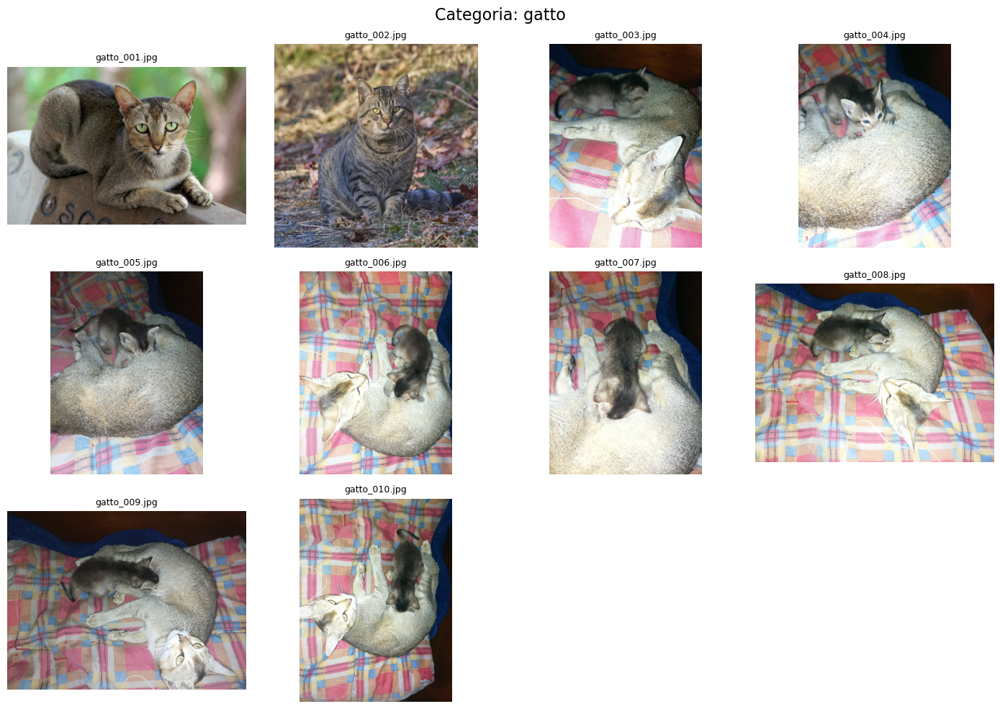

Controllo categoria: elefante


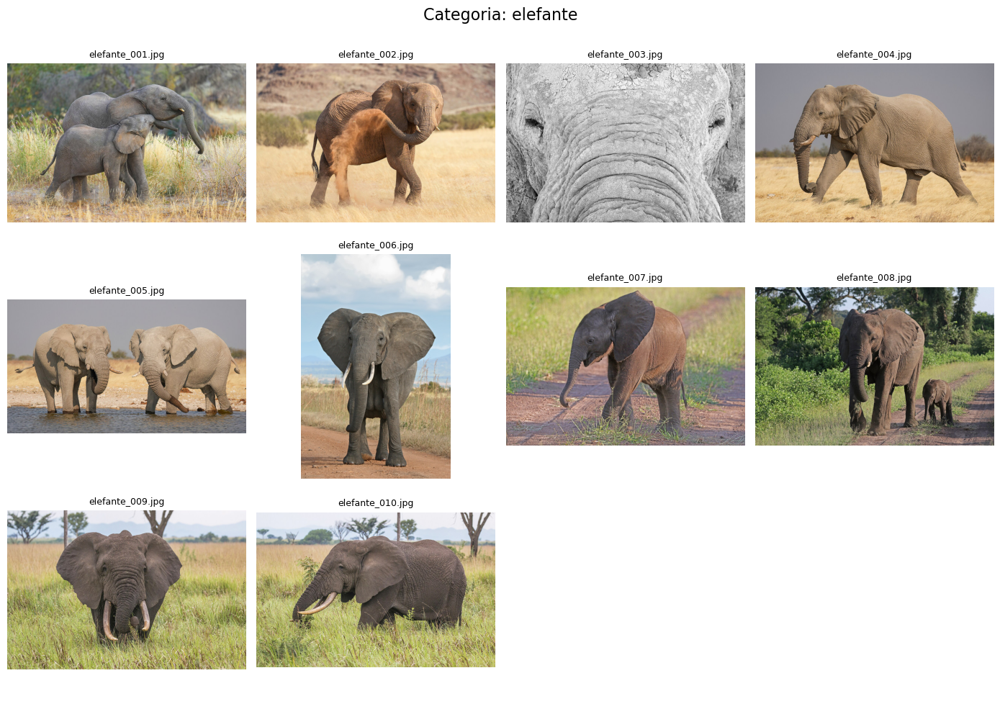

Controllo categoria: farfalla


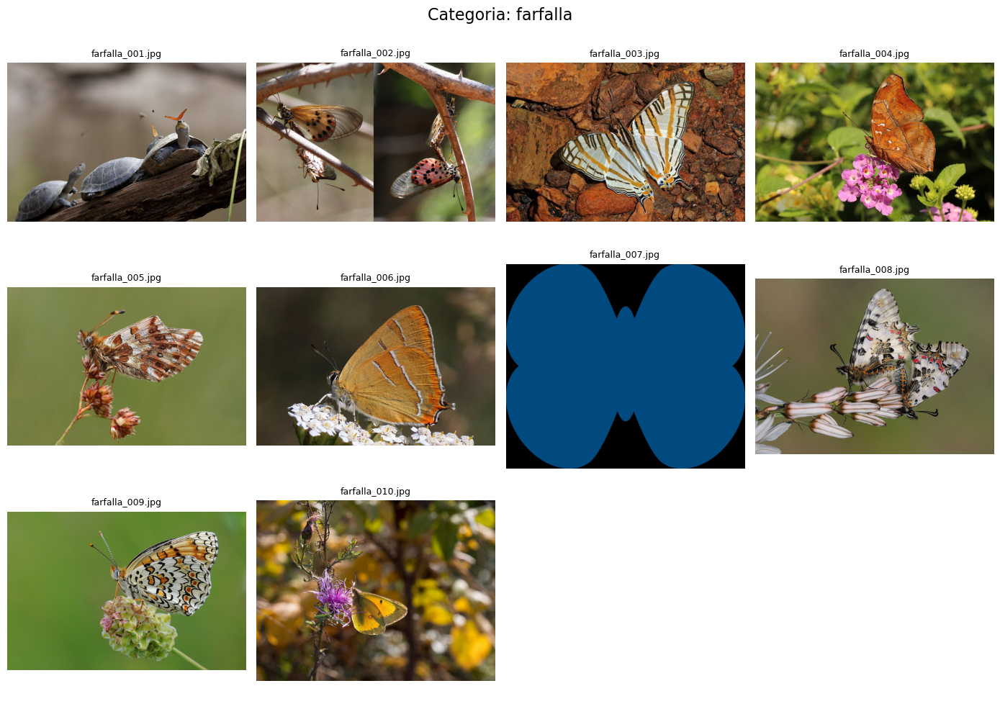

Controllo categoria: automobile


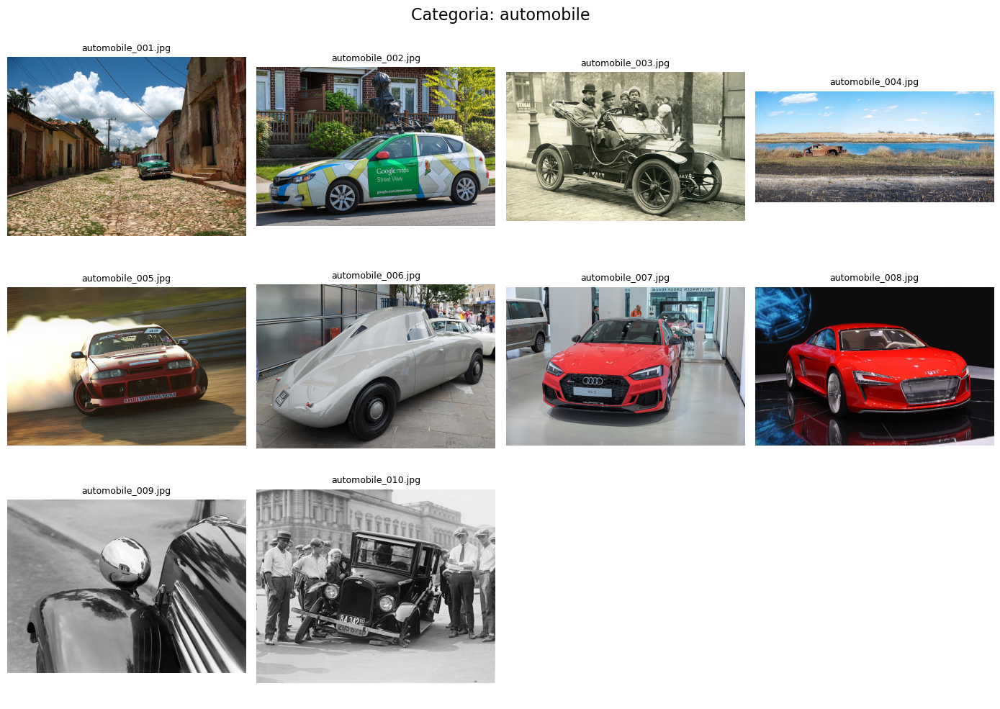

Controllo categoria: aereo


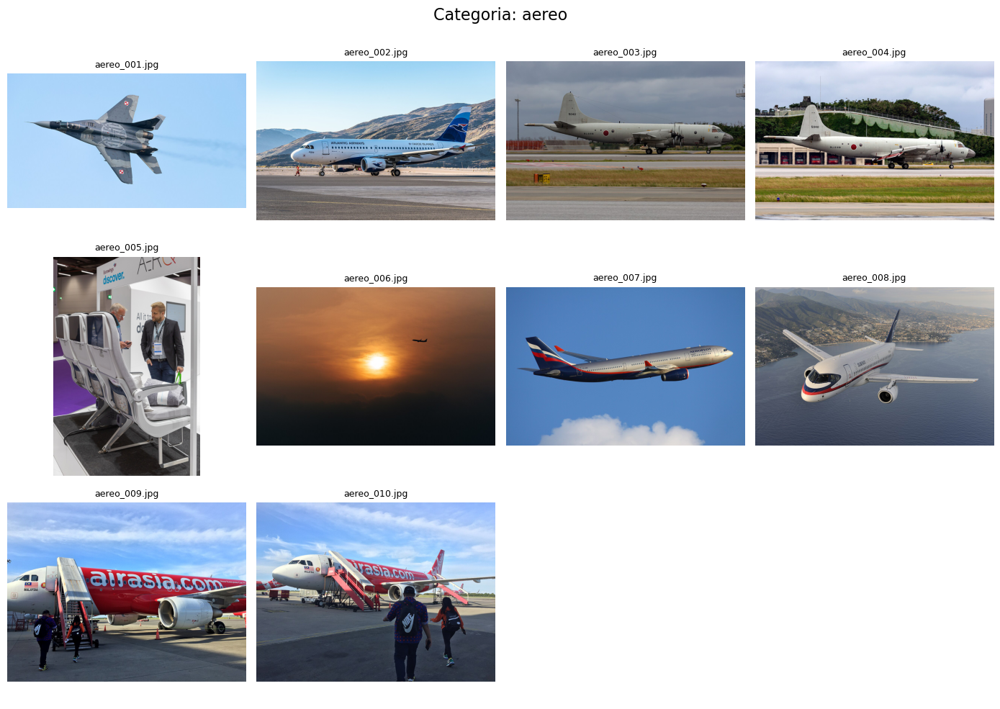

Controllo categoria: treno


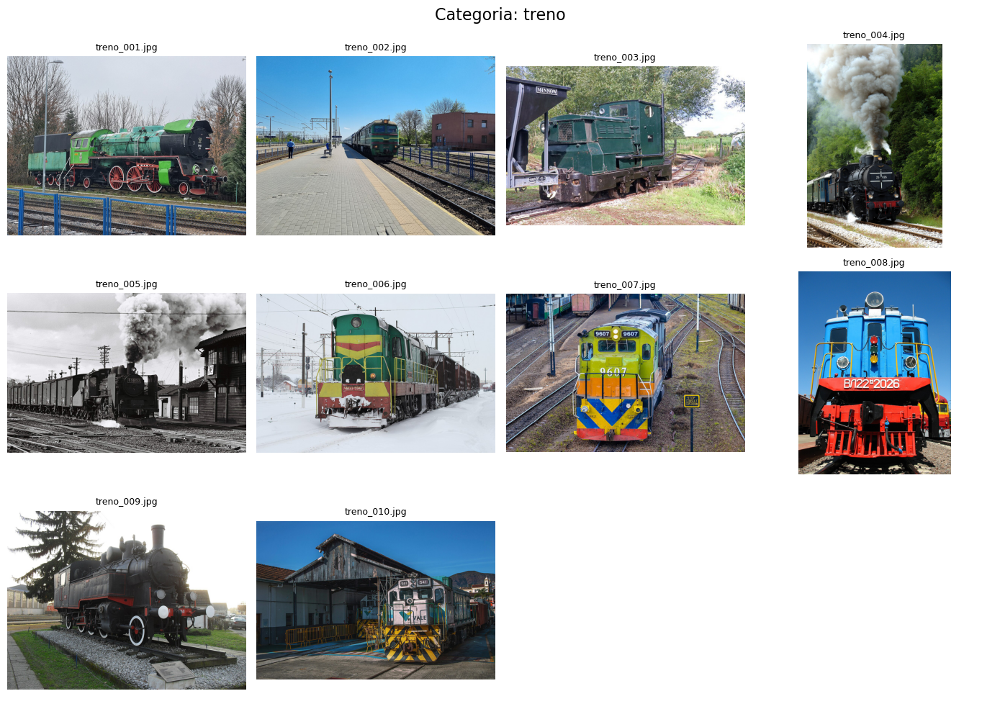

Controllo categoria: bicicletta


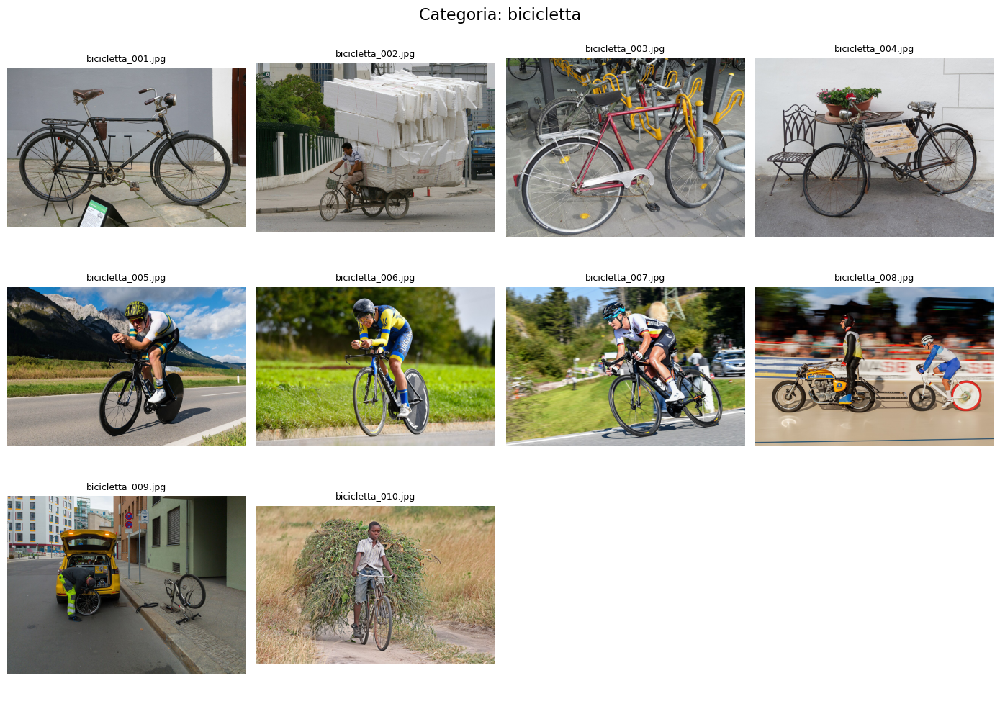

Controllo categoria: motocicletta


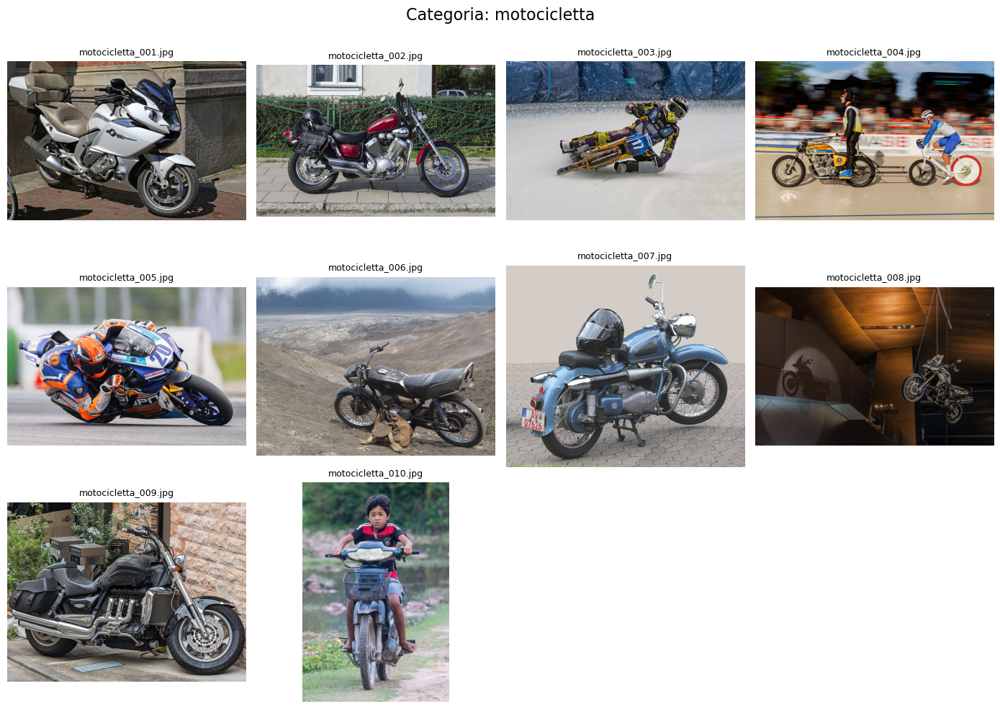

Controllo categoria: barca


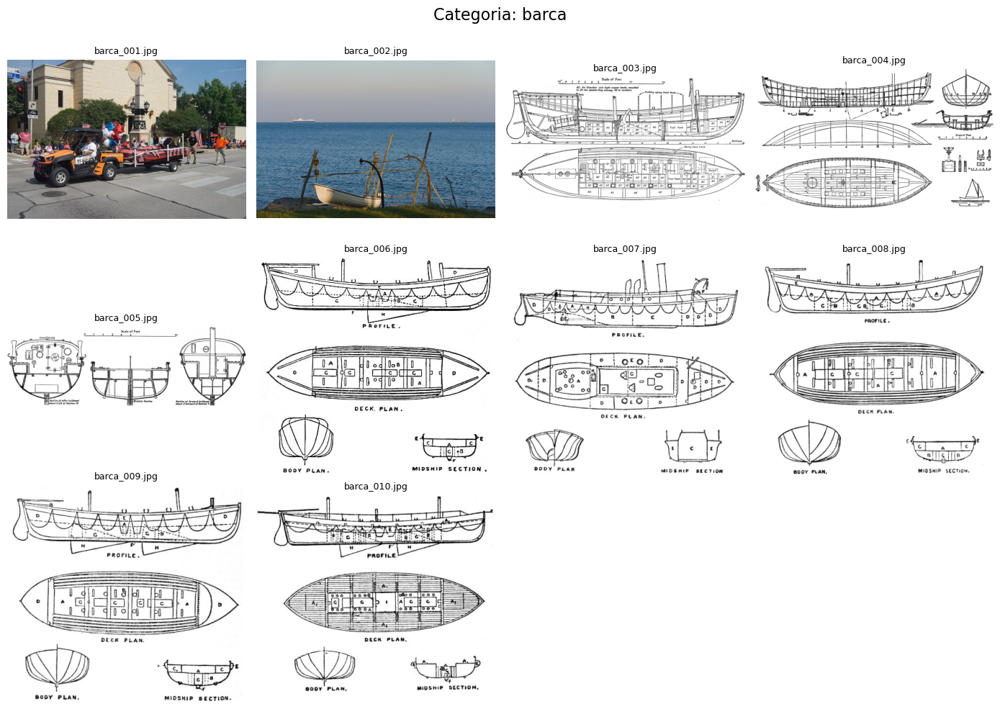

Controllo categoria: chitarra


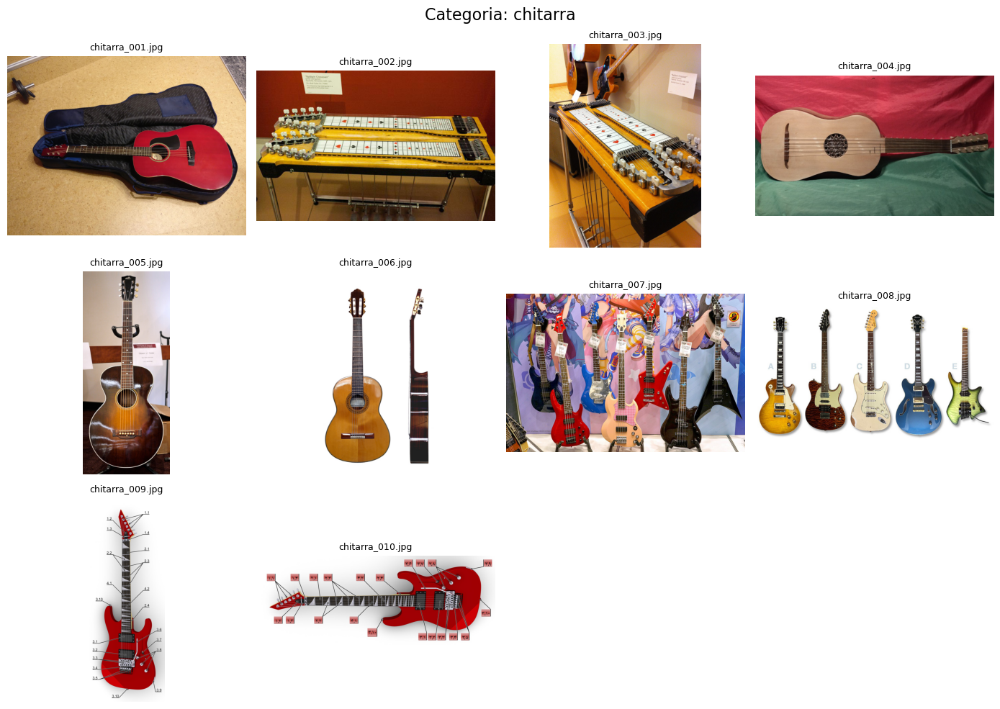

In [112]:
mostra_tutto_dataset()

In [32]:
def riepilogo_dataset_pulito():

    righe = []

    for categoria in CATEGORIE_RICERCA.keys():
        cartella = DATASET_DIR / categoria
        files = [file for file in cartella.glob("*.jpg")]
        righe.append({"categoria": categoria,"numero_immagini": len(files)})

    df_controllo = pd.DataFrame(righe)

    return df_controllo

In [33]:
df_controllo = riepilogo_dataset_pulito()

display(df_controllo)

,categoria,numero_immagini
0,gatto,10
1,elefante,10
2,farfalla,10
3,automobile,10
4,aereo,10
5,treno,10
6,bicicletta,10
7,motocicletta,10
8,barca,10
9,chitarra,10


B) IMPORTAZIONE MODELLI

b.1) Importazione 3 modelli e confronto

In [34]:
#dizionario della classi ImageNet 
CLASSI_IMAGENET = {

    "gatto": [
        "tabby",
        "tiger_cat",
        "Persian_cat",
        "Egyptian_cat",
        "Siamese_cat"
    ],
    "elefante": [
        "African_elephant",
        "Indian_elephant",
        "tusker"
    ],
    "farfalla": [
        "monarch",
        "ringlet",
        "sulphur_butterfly",
        "admiral",
        "cabbage_butterfly",
        "lycaenid"
    ],
    "automobile": [
        "sports_car",
        "convertible",
        "limousine",
        "minivan",
        "jeep",
        "cab",
        "racer",
        "car_wheel"
    ],
    "aereo": [
        "airliner",
        "warplane",
        "aircraft_carrier",
        "airship",
        "wing"
    ],
    "treno": [
        "steam_locomotive",
        "electric_locomotive",
        "passenger_car",
        "bullet_train",
        "freight_car"
    ],
    "bicicletta": [
        "mountain_bike",
        "bicycle-built-for-two"
    ],
    "motocicletta": [
        "motorcycle",
        "motor_scooter"
    ],
    "barca": [
        "canoe",
        "catamaran",
        "fireboat",
        "lifeboat",
        "speedboat",
        "yawl",
        "pirate"
    ],
    "chitarra": [
        "acoustic_guitar",
        "electric_guitar"
    ]
}

---------------  B) MODELLI -------------------

B.1) Carico i modelli

In [114]:
#Importazione modelli che rinomino

#ogni rete ha il proprio preprocess_input
#Rinomino le funzioni (preprocess_input e decode_predictions in modo diverso per tener traccia del modlelo)

from tensorflow.keras.applications.mobilenet_v2 import (
    MobileNetV2,
    preprocess_input as mobilenet_preprocess, #scala i pixel tra -1 e 1
    decode_predictions as mobilenet_decode
)

from tensorflow.keras.applications.vgg16 import (
    VGG16,
    preprocess_input as vgg16_preprocess, #sottrae la media RGB di imagenet (no scala)
    decode_predictions as vgg16_decode
)

from tensorflow.keras.applications.resnet50 import (
    ResNet50,
    preprocess_input as resnet_preprocess,
    decode_predictions as resnet_decode
)


B.2) Configurazione modelli

In [115]:
#Carico i modelli con la propria configurazione: modello, funzione di preprocessamento, funzione di decodifica e dimensione di input
#model: rete vera e propria
#prepocess: funzione di preprocessamento dell'immagine
#decode: funzione di decodifica dei risultati della rete
#input_size: dimensione di input richiesta dalla rete
MODELLI = {
    "MobileNetV2": {
        "model": MobileNetV2(
            weights="imagenet",
            include_top=True
        ),
        "preprocess": mobilenet_preprocess,
        "decode": mobilenet_decode,
        "input_size": (224, 224)
    },

    "VGG16": {
        "model": VGG16(
            weights="imagenet",
            include_top=True
        ),
        "preprocess": vgg16_preprocess,
        "decode": vgg16_decode,
        "input_size": (224, 224)
    },

    "ResNet50": {
        "model": ResNet50(
            weights="imagenet",
            include_top=True
        ),
        "preprocess": resnet_preprocess,
        "decode": resnet_decode,
        "input_size": (224, 224)
    },

}

In [119]:
#funzione comune per tutte le reti
from tensorflow.keras.preprocessing.image import img_to_array

def prepara_immagine(percorso_file, input_size, preprocess_modello):
    """
    Apre un'immagine locale e la prepara per uno specifico modello.
    """
    img = Image.open(percorso_file).convert("RGB") #apre l'immagine e forza a 3 canali di colore (RGB)
    img = img.resize(input_size) #ridimensiona l'immagine alla dimensione richiesta dal modello
    x =img_to_array(img) #converte l'immagine in un array numpy
    x = np.expand_dims(x, axis=0) #aggiunge una dimensione per il batch (modello si aspetta un batch di immagini)
    x = preprocess_modello(x) #preprocessamento specifico per il modello

    return x

In [120]:
#funzione di classificazione per un singolo modello

def classifica_immagine(percorso_file,nome_modello,configurazione,top=5):
    """
    Classifica una singola immagine con uno specifico modello.
    """
    x = prepara_immagine(percorso_file=percorso_file,input_size=configurazione["input_size"],preprocess_modello=configurazione["preprocess"])
    inizio = time.perf_counter()
    predizioni = configurazione["model"].predict(x,verbose=0)
    fine = time.perf_counter()
    tempo = fine - inizio

    risultati = configurazione["decode"]( predizioni,top=top)[0]

    riga = {"categoria_reale": percorso_file.parent.name,"file": percorso_file.name,"modello": nome_modello,"tempo_sec": round(tempo, 4)}

    for posizione, (_, classe, probabilita) in enumerate(risultati,start=1):
        riga[f"top_{posizione}_classe"] = classe
        riga[f"top_{posizione}_probabilita_%"] = round(probabilita * 100,2)

    return riga

In [118]:
risultati = []

for cartella in sorted(DATASET_DIR.iterdir()): #per ogni cartella
    if not cartella.is_dir():
        continue
    files = [file for file in cartella.iterdir() if file.suffix.lower() in ESTENSIONI_VALIDE]

    if len(files) == 0:
        print(f"Salto {cartella.name}: nessuna immagine")
        continue

    for file in files: #per ogni files (immgine) della cartella
        for nome_modello, configurazione in MODELLI.items(): #per ogni modello
            print(f"Classifico {cartella.name}/{file.name} con {nome_modello}")
            try:
                riga = classifica_immagine(percorso_file=file,nome_modello=nome_modello,configurazione=configurazione,top=5)
                risultati.append(riga)
            except Exception as errore:
                risultati.append({"categoria_reale": cartella.name,"file": file.name,"modello": nome_modello,"errore": str(errore)})

Classifico aereo/aereo_001.jpg con MobileNetV2
Classifico aereo/aereo_001.jpg con VGG16
Classifico aereo/aereo_001.jpg con ResNet50
Classifico aereo/aereo_002.jpg con MobileNetV2
Classifico aereo/aereo_002.jpg con VGG16
Classifico aereo/aereo_002.jpg con ResNet50
Classifico aereo/aereo_003.jpg con MobileNetV2
Classifico aereo/aereo_003.jpg con VGG16
Classifico aereo/aereo_003.jpg con ResNet50
Classifico aereo/aereo_004.jpg con MobileNetV2
Classifico aereo/aereo_004.jpg con VGG16
Classifico aereo/aereo_004.jpg con ResNet50
Classifico aereo/aereo_005.jpg con MobileNetV2
Classifico aereo/aereo_005.jpg con VGG16
Classifico aereo/aereo_005.jpg con ResNet50
Classifico aereo/aereo_006.jpg con MobileNetV2
Classifico aereo/aereo_006.jpg con VGG16
Classifico aereo/aereo_006.jpg con ResNet50
Classifico aereo/aereo_007.jpg con MobileNetV2
Classifico aereo/aereo_007.jpg con VGG16
Classifico aereo/aereo_007.jpg con ResNet50
Classifico aereo/aereo_008.jpg con MobileNetV2
Classifico aereo/aereo_008.jp

In [123]:
df_risultati = pd.DataFrame(risultati)
display(df_risultati)

,categoria_reale,file,modello,tempo_sec,top_1_classe,top_1_probabilita_%,top_2_classe,top_2_probabilita_%,top_3_classe,top_3_probabilita_%,top_4_classe,top_4_probabilita_%,top_5_classe,top_5_probabilita_%
0,aereo,aereo_001.jpg,MobileNetV2,3.3205,warplane,93.400002,wing,4.570000,projectile,0.23,space_shuttle,0.15,airliner,0.13
1,aereo,aereo_001.jpg,VGG16,1.4378,warplane,90.059998,wing,9.330000,airliner,0.34,projectile,0.17,missile,0.08
2,aereo,aereo_001.jpg,ResNet50,4.9822,warplane,98.690002,wing,1.220000,aircraft_carrier,0.04,airliner,0.02,projectile,0.01
3,aereo,aereo_002.jpg,MobileNetV2,0.2227,airliner,77.300003,wing,5.120000,airship,0.96,warplane,0.29,window_screen,0.19
4,aereo,aereo_002.jpg,VGG16,1.0274,airliner,94.699997,wing,4.980000,warplane,0.22,space_shuttle,0.05,aircraft_carrier,0.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,treno,treno_009.jpg,VGG16,0.9119,steam_locomotive,97.620003,passenger_car,1.340000,electric_locomotive,0.36,freight_car,0.32,thresher,0.14
296,treno,treno_009.jpg,ResNet50,0.3818,steam_locomotive,99.900002,electric_locomotive,0.060000,passenger_car,0.03,freight_car,0.01,lumbermill,0.00
297,treno,treno_010.jpg,MobileNetV2,0.1863,jinrikisha,7.940000,freight_car,3.170000,ashcan,2.92,thresher,2.24,steam_locomotive,2.08
298,treno,treno_010.jpg,VGG16,0.8829,boathouse,32.450001,lumbermill,21.860001,mobile_home,8.37,freight_car,3.99,lakeside,2.66


In [44]:
# python -m pip install openpyxl

In [81]:
# ============================================================
# METRICHE TOP-1 E TOP-5
# ============================================================

def classe_appartiene_categoria(categoria_reale, classe_predetta):
    """
    Restituisce True se la classe ImageNet predetta appartiene
    alla categoria reale definita nel nostro dizionario.
    """
    classi_valide = CLASSI_IMAGENET.get(categoria_reale, [])
    return classe_predetta in classi_valide

In [124]:
#metriche Top-1 e Top-5
def valuta_riga(row):
    """
    Calcola se la previsione è corretta in Top-1 e in Top-5.
    """
    categoria_reale = row["categoria_reale"]
    top1 = row.get("top_1_classe", "")
    top5 = [row.get(f"top_{i}_classe", "")
        for i in range(1, 6)
    ]
    corretto_top1 = classe_appartiene_categoria(categoria_reale,top1)
    corretto_top5 = any(classe_appartiene_categoria(categoria_reale,classe)
        for classe in top5
    )

    return pd.Series({"corretto_top1": corretto_top1,"corretto_top5": corretto_top5})

In [125]:
valutazioni = df_risultati.apply(
    valuta_riga,
    axis=1
)

df_risultati = pd.concat(
    [df_risultati, valutazioni],
    axis=1
)

In [126]:
print(df_risultati)
display(
    df_risultati[
        [
            "categoria_reale",
            "file",
            "modello",
            "top_1_classe",
            "corretto_top1",
            "corretto_top5"
        ]
    ].head(20)
)

    categoria_reale           file      modello  tempo_sec      top_1_classe  \
0             aereo  aereo_001.jpg  MobileNetV2     3.3205          warplane   
1             aereo  aereo_001.jpg        VGG16     1.4378          warplane   
2             aereo  aereo_001.jpg     ResNet50     4.9822          warplane   
3             aereo  aereo_002.jpg  MobileNetV2     0.2227          airliner   
4             aereo  aereo_002.jpg        VGG16     1.0274          airliner   
..              ...            ...          ...        ...               ...   
295           treno  treno_009.jpg        VGG16     0.9119  steam_locomotive   
296           treno  treno_009.jpg     ResNet50     0.3818  steam_locomotive   
297           treno  treno_010.jpg  MobileNetV2     0.1863        jinrikisha   
298           treno  treno_010.jpg        VGG16     0.8829         boathouse   
299           treno  treno_010.jpg     ResNet50     0.3389       freight_car   

     top_1_probabilita_%         top_2_

,categoria_reale,file,modello,top_1_classe,corretto_top1,corretto_top5
0,aereo,aereo_001.jpg,MobileNetV2,warplane,True,True
1,aereo,aereo_001.jpg,VGG16,warplane,True,True
2,aereo,aereo_001.jpg,ResNet50,warplane,True,True
3,aereo,aereo_002.jpg,MobileNetV2,airliner,True,True
4,aereo,aereo_002.jpg,VGG16,airliner,True,True
5,aereo,aereo_002.jpg,ResNet50,airliner,True,True
6,aereo,aereo_003.jpg,MobileNetV2,airliner,True,True
7,aereo,aereo_003.jpg,VGG16,warplane,True,True
8,aereo,aereo_003.jpg,ResNet50,warplane,True,True
9,aereo,aereo_004.jpg,MobileNetV2,airliner,True,True


In [127]:
# ============================================================
# RIEPILOGO PER MODELLO
# ============================================================

df_riepilogo = (
    df_risultati
    .groupby("modello")
    .agg(
        immagini_valutate=("file", "count"),
        accuracy_top1=("corretto_top1", "mean"),
        accuracy_top5=("corretto_top5", "mean"),
        tempo_medio_sec=("tempo_sec", "mean"),
        tempo_min_sec=("tempo_sec", "min"),
        tempo_max_sec=("tempo_sec", "max")
    )
    .reset_index()
)

In [128]:
df_riepilogo["accuracy_top1_%"] = (df_riepilogo["accuracy_top1"] * 100).round(2)
df_riepilogo["accuracy_top5_%"] = (df_riepilogo["accuracy_top5"] * 100).round(2)
df_riepilogo["tempo_medio_sec"] = (df_riepilogo["tempo_medio_sec"].round(4))
df_riepilogo["tempo_min_sec"] = (df_riepilogo["tempo_min_sec"].round(4))
df_riepilogo["tempo_max_sec"] = (df_riepilogo["tempo_max_sec"].round(4))

In [129]:
df_riepilogo = df_riepilogo[
    [
        "modello",
        "immagini_valutate",
        "accuracy_top1_%",
        "accuracy_top5_%",
        "tempo_medio_sec",
        "tempo_min_sec",
        "tempo_max_sec"
    ]
]

In [130]:
df_riepilogo = df_riepilogo.sort_values(
    by=[
        "accuracy_top1_%",
        "accuracy_top5_%",
        "tempo_medio_sec"
    ],
    ascending=[
        False,
        False,
        True
    ]
)

In [131]:
display(df_riepilogo)

,modello,immagini_valutate,accuracy_top1_%,accuracy_top5_%,tempo_medio_sec,tempo_min_sec,tempo_max_sec
0,MobileNetV2,100,58.0,78.0,0.2697,0.1569,3.3205
2,VGG16,100,58.0,75.0,1.0375,0.6062,1.8515
1,ResNet50,100,53.0,75.0,0.4558,0.2729,4.9822


In [132]:
df_riepilogo["posizione"] = range(
    1,
    len(df_riepilogo) + 1
)

df_riepilogo = df_riepilogo[
    [
        "posizione",
        "modello",
        "immagini_valutate",
        "accuracy_top1_%",
        "accuracy_top5_%",
        "tempo_medio_sec",
        "tempo_min_sec",
        "tempo_max_sec"
    ]
]

In [133]:
# ============================================================
# EXPORT EXCEL MULTIFOGLIO
# ============================================================

from pathlib import Path
from datetime import datetime

REPORT_DIR = Path("reports")
REPORT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

OUTPUT_REPORT = (
    REPORT_DIR
    / f"benchmark_modelli_{timestamp}.xlsx"
)

with pd.ExcelWriter(
    OUTPUT_REPORT,
    engine="openpyxl"
) as writer:

    df_risultati.to_excel(
        writer,
        sheet_name="Dettaglio",
        index=False
    )

    df_riepilogo.to_excel(
        writer,
        sheet_name="Riepilogo",
        index=False
    )

print(
    f"Report creato: "
    f"{OUTPUT_REPORT.resolve()}"
)

Report creato: C:\Users\uberti\iCloudDrive\iCloudDrive\Barbara\EPICODE\PYTHON\MODULO 4\5_RetiConvoluzionali\reports\benchmark_modelli_20260714_194004.xlsx


In [135]:
# ============================================================
# ANALISI PER CATEGORIA E MODELLO
# ============================================================

df_categoria_modello = (
    df_risultati
    .groupby(
        [
            "modello",
            "categoria_reale"
        ]
    )
    .agg(
        immagini=("file", "count"),
        accuracy_top1=("corretto_top1", "mean"),
        accuracy_top5=("corretto_top5", "mean"),
        tempo_medio_sec=("tempo_sec", "mean")
    )
    .reset_index()
)

In [136]:
#conversione in percentuale

df_categoria_modello["accuracy_top1_%"] = (
    df_categoria_modello["accuracy_top1"] * 100
).round(2)

df_categoria_modello["accuracy_top5_%"] = (
    df_categoria_modello["accuracy_top5"] * 100
).round(2)

df_categoria_modello["tempo_medio_sec"] = (
    df_categoria_modello["tempo_medio_sec"]
    .round(4)
)

In [137]:
#tengo solo le colonne finali

df_categoria_modello = df_categoria_modello[
    [
        "modello",
        "categoria_reale",
        "immagini",
        "accuracy_top1_%",
        "accuracy_top5_%",
        "tempo_medio_sec"
    ]
]

In [138]:
with pd.ExcelWriter(
    OUTPUT_REPORT,
    engine="openpyxl"
) as writer:

    df_risultati.to_excel(
        writer,
        sheet_name="Dettaglio",
        index=False
    )

    df_riepilogo.to_excel(
        writer,
        sheet_name="Riepilogo",
        index=False
    )

    df_categoria_modello.to_excel(
        writer,
        sheet_name="Per_categoria",
        index=False
    )
    

In [139]:
# ============================================================
# CARATTERISTICHE STRUTTURALI DEI MODELLI
# ============================================================

righe_modelli = []

for nome_modello, configurazione in MODELLI.items():

    modello = configurazione["model"]

    parametri_totali = modello.count_params()

    # Stima semplice:
    # ogni parametro float32 occupa circa 4 byte.
    dimensione_teorica_mb = (
        parametri_totali * 4
    ) / (1024 ** 2)

    righe_modelli.append({
        "modello": nome_modello,
        "parametri_totali": parametri_totali,
        "parametri_milioni": round(
            parametri_totali / 1_000_000,
            2
        ),
        "dimensione_teorica_mb": round(
            dimensione_teorica_mb,
            2
        )
    })


df_caratteristiche_modelli = pd.DataFrame(
    righe_modelli
)

display(df_caratteristiche_modelli)

,modello,parametri_totali,parametri_milioni,dimensione_teorica_mb
0,MobileNetV2,3538984,3.54,13.50
1,VGG16,138357544,138.36,527.79
2,ResNet50,25636712,25.64,97.80


In [140]:
#uniamo metriche e caratteristiche

df_benchmark_completo = df_riepilogo.merge(
    df_caratteristiche_modelli,
    on="modello",
    how="left"
)

display(df_benchmark_completo)

,posizione,modello,immagini_valutate,accuracy_top1_%,accuracy_top5_%,tempo_medio_sec,tempo_min_sec,tempo_max_sec,parametri_totali,parametri_milioni,dimensione_teorica_mb
0,1,MobileNetV2,100,58.0,78.0,0.2697,0.1569,3.3205,3538984,3.54,13.50
1,2,VGG16,100,58.0,75.0,1.0375,0.6062,1.8515,138357544,138.36,527.79
2,3,ResNet50,100,53.0,75.0,0.4558,0.2729,4.9822,25636712,25.64,97.80


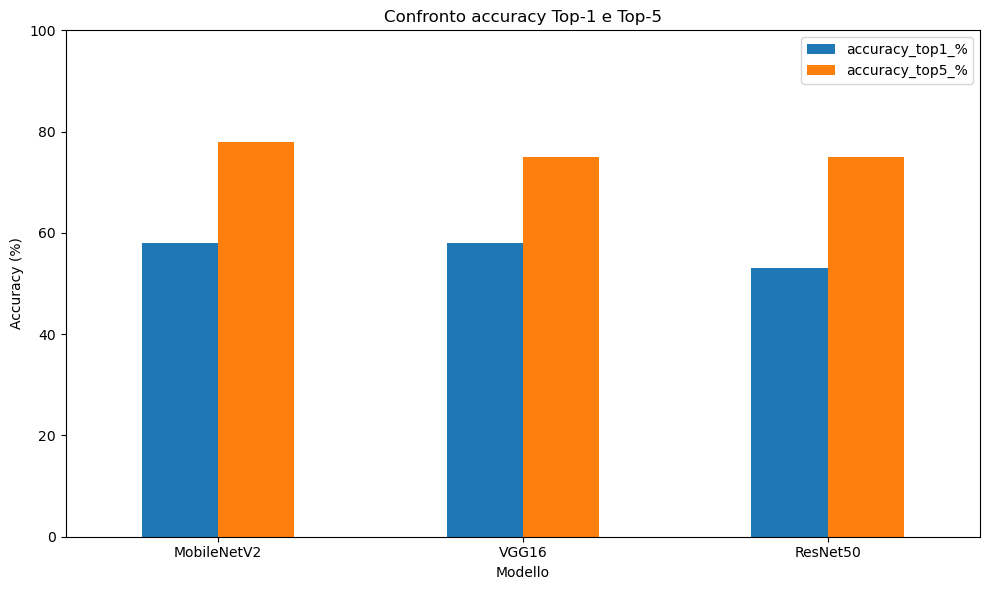

In [ ]:
#grafico accuracy top-1 e top-5

# ============================================================
# GRAFICO ACCURACY
# ============================================================

#ordinamento
grafico_accuracy = (df_benchmark_completo.set_index("modello")[["accuracy_top1_%","accuracy_top5_%"]])

ax = grafico_accuracy.plot(kind="bar",figsize=(10, 6))
ax.set_title("Confronto accuracy Top-1 e Top-5")
ax.set_xlabel("Modello")
ax.set_ylabel("Accuracy (%)")
ax.set_ylim(0, 100)

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Interpretazione:

Top-1: la prima risposta deve appartenere alla categoria corretta.
Top-5: almeno una delle prime cinque risposte deve essere corretta.
Top-5 sarà normalmente maggiore o uguale a Top-1.

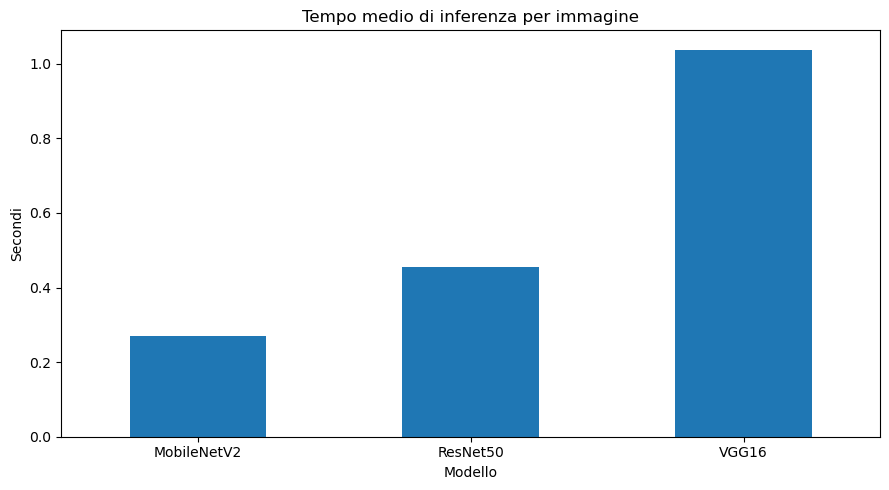

In [142]:
# ============================================================
# GRAFICO TEMPO MEDIO DI INFERENZA
# ============================================================

ax = (df_benchmark_completo.set_index("modello")["tempo_medio_sec"].sort_values().plot(kind="bar",figsize=(9, 5)))
ax.set_title("Tempo medio di inferenza per immagine")
ax.set_xlabel("Modello")
ax.set_ylabel("Secondi")

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()